For the purposes of recognizing some diseases using ML to collect appropriate 
data is of vital importance. Developed solutions to build DICOM services on the 
market are various. Automated mechanisms are required in order to collect a large number of images.
I tried to build a service for research purposes to collect data using an API.
There are Service Class Provider (SCP) and Service Class User (SCU). 
Such collecting is limited to have obtaining authorities and 
the download process requires a lot of time due bandwidth limits.
I found one resource out which allows downloading Dicom samples.
Access to these images requires a valid Premium Membership (69,99 of dollars monthly or 99,00 for one year). 
You have to be sure to buy appropriate samples. 
I failed to find any datasets of CT cardiac in free access.

*I have been scrolled through a lot of information about the processing of Dicom images. 
There are gathered the main required:*
- The tags of the protocol descriptions have to be attentive:
- Modality "CT" (Computed Tomography) (0008,0060);
- BodyPartExamined (0018,0015) To filter the cardiac anatomic regions have to be consulted with domain professionals.
- A medical record number (MRN) uniquely identifies a patient within a health system. Images from the same patient must all be grouped into the same set.

*During creating the CT cardiac dataset several DICOM attributes are particularly 
important for cleaning CT volumes:* 
- Image Type, Image Orientation (Patient), Image Position (Patient), Rescale Intercept, 
- Rescale Slope, Pixel Spacing, Gantry/Detector Tilt.

The following code is the attempt of analyzing the CT images without the datasets for applying much more possibilities to take advantage. Nevertheless, the research through analyzing the newest reports, libraries are required to achieve more.

In [359]:
%matplotlib inline

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation

from skimage import measure, morphology

# Some constants 
INPUT_FOLDER = './data/'
patients = os.listdir(INPUT_FOLDER)
patients.sort()

In [528]:
def itkImageEnhancement(img, my_method):
    # Define function itkImageEnhancement
    result = []
    if my_method == 'GSD':                      # chose the method of enhancement
        # save the file named result in the same path
        result = sitk.GrayscaleDilate(img)
        # Tell the user function worked successfully
        print('Gray Scale Dilate')
    elif my_method == 'AHE':
        result = sitk.AdaptiveHistogramEqualization(img)
        print('Adaptive Histogram Equalization')
    elif my_method == 'LS':
        result = sitk.LaplacianSharpening(img)
        print('Laplace Sharpening')
    else:
        print('Error')   # Return an error

    return result

In [360]:
patients

['Im00746676', 'Im00751830', 'Im00752021']

In [361]:
def plot_hu_histogram(ctvol):
    #Histogram of HUs https://www.kaggle.com/gzuidhof/full-preprocessing-tutorial
    plt.hist(ctvol.flatten(), bins=80, color='c')
    plt.xlabel("Hounsfield Units (HU)")
    plt.ylabel("Frequency")
    plt.show()

In [362]:
import SimpleITK as sitk
import os
import numpy as np
import cv2

def read_image(in_file):
    image = sitk.ReadImage(in_file)
    return image

def get_the_image_list(input_path):
    image_list = []
    image_name = []
    image_list_append = image_list.append
    image_name_append = image_name.append
    
    stats = sitk.StatisticsImageFilter()
    m = 0.

    if os.path.exists(input_path) and os.path.isdir(input_path):
        files = os.listdir(input_path)
        m = 0.
        for f in files:
            if f.endswith('png'):
                image = read_image(input_path + "\\" + f)
                image_list_append(image)
                image_name_append(f)
                stats.Execute(image)
                m += stats.GetMean()
                
    return image_list, image_name, m


def get_pixels_hu(slices):
    image = np.stack([sitk.GetArrayFromImage(s) for s in slices])
    
    # Set outside-of-scan pixels to 1
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0

    image[image > 1200] = 0

    thresh_lo = -100
    thresh_hi = 400

    image = np.clip(image, thresh_lo, thresh_hi)

    
    #image = image / 255.

    return np.array(image, dtype=np.int16)

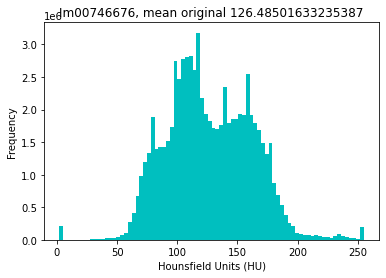

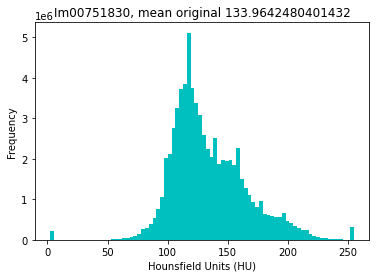

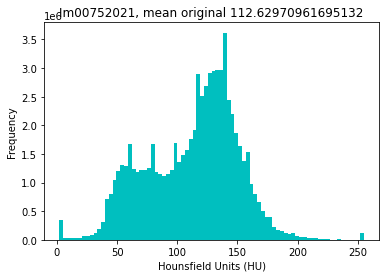

In [363]:
slices_hu = []
slices = []
slices_names = []
slices_hu_append = slices_hu.append
slices_names_append = slices_names.append
slices_append = slices.append



for patient in patients:
    slices_, slices_names_, m = get_the_image_list(INPUT_FOLDER + patient)
    
    l = len(slices_)
    if l:
        meanIntensityTrain = m/l

        slices_names_append(slices_names_) 
        slices_append(slices_)
        slices_hu_ = get_pixels_hu(slices_)
        slices_hu_append(slices_hu_)
        plt.title(patient + ', mean original ' + str(meanIntensityTrain))
        plt.hist(slices_hu_.flatten(), bins=80, color='c')
        plt.xlabel("Hounsfield Units (HU)")
        plt.ylabel("Frequency")
        plt.show()

In [364]:
def show_flow_slice(slice_):
    fig = plt.figure()
    plt.axis('off')
    myimages = []

    for s in slice_:
        img = sitk.GetArrayFromImage(s)
        img[img == -2000] = 0
        img[img > 1200] = 0

        thresh_lo = -100
        thresh_hi = 400

        img = np.clip(img, thresh_lo, thresh_hi)
        imgplot = plt.imshow(img, cmap='gray')

        # append AxesImage object to the list
        myimages.append([imgplot])
       
    ## create an instance of animation
    anim = animation.ArtistAnimation(fig, myimages, interval=75, repeat_delay=3000, blit=True)
    return anim

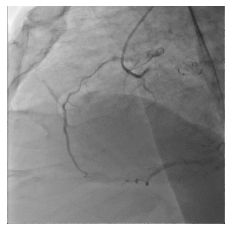

In [365]:
anim_slice = show_flow_slice(slices[0])
HTML(anim_slice.to_jshtml())

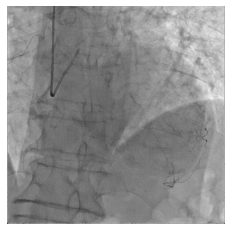

In [366]:
anim_slice = show_flow_slice(slices[1])
HTML(anim_slice.to_jshtml())

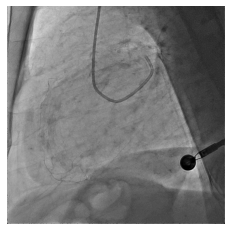

In [367]:
anim_slice = show_flow_slice(slices[2])
HTML(anim_slice.to_jshtml())

In [368]:
anim_slice.save(f'./{patients[2]}.mp4', writer = 'ffmpeg', fps = 30)  #'./data/Im00752021.mp4'

### Getting the first segment

In [596]:
image1_file_name = slises_hu[0][0]
image2_file_name = slises_hu[0][12]

In [597]:
dif = image1_file_name - image2_file_name

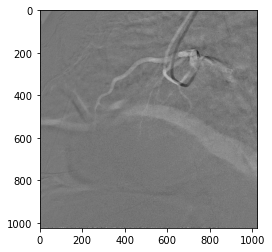

In [598]:
 # get an image from the array input
plt.imshow(dif, cmap='gray')

In [549]:
def intensity_seg(ct_numpy, min, max):
    clipped = ct_numpy.clip(min, max)
    clipped[clipped != max] = 1
    clipped[clipped == max] = 0
    return measure.find_contours(clipped, 0.95)

def show_contour(image, contours):
    fig, ax = plt.subplots()
    ax.imshow(image.T, cmap=plt.cm.gray)
    for contour in contours:
        ax.plot(contour[:, 0], contour[:, 1], linewidth=1)

    plt.axis('off')
    plt.show()

In [550]:
dif[dif<0].min()

-157

In [551]:
contours = intensity_seg(dif, -157, -50)

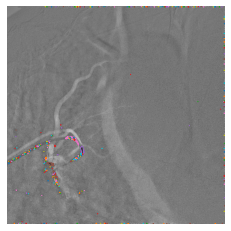

In [553]:
show_contour(dif, contours)

### Normalize the data(zero mean and unit variance) 

It can be used to prepare data to apply ML

In [599]:
def get_normalized_segment(dif):
    img = sitk.GetImageFromArray(dif)
    img = sitk.Cast(img, sitk.sitkFloat32)
    image_pre = sitk.CannyEdgeDetection(img)
    im_new = sitk.ShapeDetectionLevelSet(img, image_pre)
    
    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    maskImage = sitk.OtsuThreshold(im_new, 0, 1, 200)
    output = corrector.Execute(im_new, maskImage)
    img = sitk.GetArrayFromImage(output)
    plt.axis('off')
    plt.imshow(img, cmap='gray')    

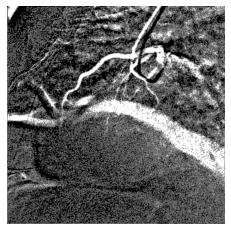

In [600]:
get_normalized_segment(dif)

In [608]:
image1_file_name = slises_hu[0][13]
image2_file_name = slises_hu[0][19]
dif = image1_file_name - image2_file_name
dif[dif<0].min()

-127

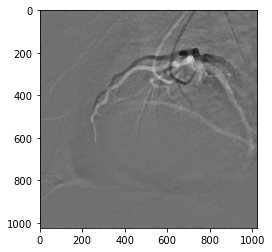

In [609]:
# get an image from the array input
plt.imshow(dif, cmap='gray')

In [615]:
dif.min()

-127

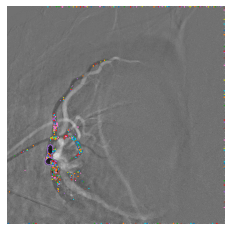

In [617]:
contours = intensity_seg(dif, -127, -50)
show_contour(dif, contours)

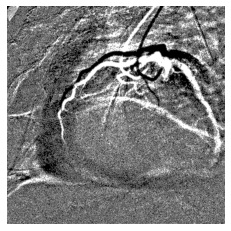

In [618]:
get_normalized_segment(dif)

In [619]:
image1_file_name = slises_hu[0][20]
image2_file_name = slises_hu[0][33]
dif = image1_file_name - image2_file_name
dif[dif<0].min()

-144

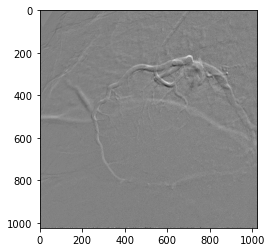

In [620]:
plt.imshow(dif, cmap='gray')

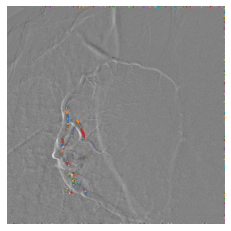

In [629]:
contours = intensity_seg(dif, -144, -50)
show_contour(dif, contours)

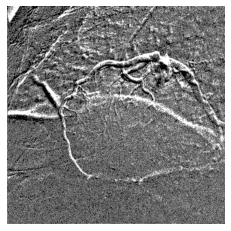

In [621]:
get_normalized_segment(dif)

In [636]:
from scipy.spatial import ConvexHull

def contour_distance(contour):
    """
    Given a set of points that may describe a contour
     it calculates the distance between the first and the last point
     to infer if the set is closed.
    Args:
        contour: np array of x and y points

    Returns: euclidean distance of first and last point
    """
    dx = contour[0, 1] - contour[-1, 1]
    dy = contour[0, 0] - contour[-1, 0]
    return np.sqrt(np.power(dx, 2) + np.power(dy, 2))

def set_is_closed(contour):
    if contour_distance(contour) < 1:
        return True
    else:
        return False

def find_segment(contours):
    artery_contours = []
    vol_contours = []

    for contour in contours:
        hull = ConvexHull(contour)

        if hull.volume > 100 and set_is_closed(contour):
            artery_contours.append(contour)
            vol_contours.append(hull.volume)

    if len(artery_contours) > 2:
        vol_contours, artery_contours = (list(t) for t in
                                                zip(*sorted(zip(vol_contours, artery_contours))))
        artery_contours.pop(-1)
    
    return artery_contours

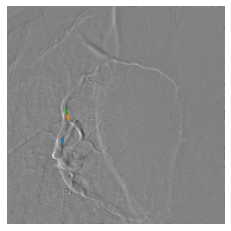

In [637]:
artery_flow_contours = find_segment(contours)
show_contour(dif, artery_flow_contours)

## Suggestions on the further  analytics/approaches which could be applied:
- Transformers-based framework achieves state-of-the-art performance in medical image segmentation applications. 
U-Net, the U-shaped convolutional neural network architecture.
- Different functional cardiac CT techniques:
cine-CT, CT-FFR, CT-myocardial perfusion

Now ITK libriry fot image-processing is developing so fast. It would be great to try new possibilities.
https://pypi.org/project/itk/

Used resourses:
https://dicom.innolitics.com/ciods/cr-image/general-series/00080060
https://en.wikipedia.org/wiki/Coronary_arteries
https://glassboxmedicine.com/2021/02/16/downloading-and-preprocessing-medical-images-in-bulk-dicom-to-numpy-with-python/
https://analyticsindiamag.com/hands-on-transunet-transformers-for-medical-image-segmentation/
https://www.osirix-viewer.com/resources/dicom-image-library/
https://www.voltron.studio/article/build-a-dicom-dimse-c-store-service-with-python
https://www.docsopinion.com/coronary-calcium-score/
https://insightsoftwareconsortium.github.io/SimpleITK-Notebooks/Python_html/34_Segmentation_Evaluation.html
https://github.com/black0017/ct-intensity-segmentation/blob/main/notebook%20version/Introduction_to_medical_imaging_with_Python_CT_segmentation_without_any_labels_.ipynb

In [ ]:
Resurses to deep dive:
https://bmcmedimaging.biomedcentral.com/articles/10.1186/s12880-020-00509-9
https://heart.bmj.com/content/early/2021/02/10/heartjnl-2020-318289
https://pubs.rsna.org/doi/10.1148/radiol.2532081738
https://www.digihunch.com/2020/11/medical-imaging-web-server-deployment-pipeline/